In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy import stats
import matplotlib.patches as mpatches
from sklearn import linear_model


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#set style for plt
plt.style.use('fivethirtyeight')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
###to run the same code for other dataset, just change the college.csv with other csv along with imputed and missing csv
#dframe creation
dataset = 'college'
filename = dataset + '/' + dataset +'.csv'

original_df = pd.read_csv(filename)
all_col_names = original_df.columns.to_list()

mis_col_names = [i+'_mis' for i in all_col_names]
imp_col_names = [i+'_imp' for i in all_col_names]

miss_filename = dataset +'/missing.csv'
imp_filename = dataset +'/imputed.csv'
miss_df = pd.read_csv(miss_filename,names= mis_col_names)
imp_df = pd.read_csv(imp_filename,names= imp_col_names)

df4 = original_df.join(miss_df)
combined_df = df4.join(imp_df)


In [0]:
####function to get df which has original values and imputed values
def getdf(df,col):
  col_mis = col + '_mis'
  col_imp = col + '_imp'
  idx = df[df[col_mis].isnull()].index.tolist()
  ans_df = df.iloc[idx]
  ans_df = ans_df[[col,col_imp]]
  return ans_df
  

In [0]:
###function to plot dula line graph of first 100 records of a particular feature, input - specific df and col name
def plotlinegraph(df,x):
  plt.figure(figsize=(24, 8))
  sns.lineplot(data=df.tail(200))
  plt.title("Original and Imputed Values for feature " + x)
  plt.xlabel('records')
  plt.ylabel('value')
  plt.show()

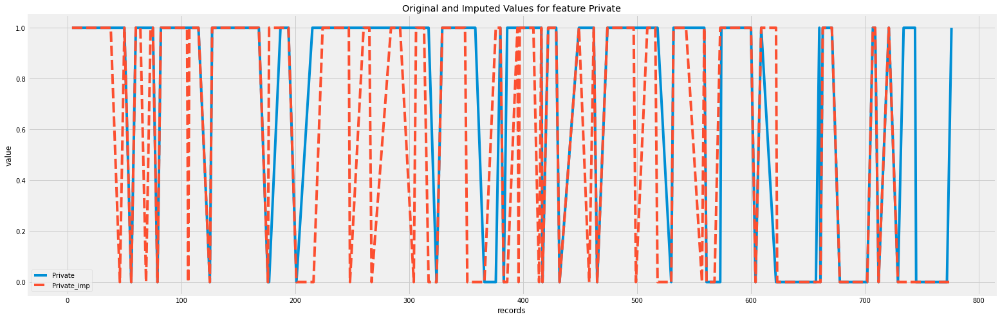

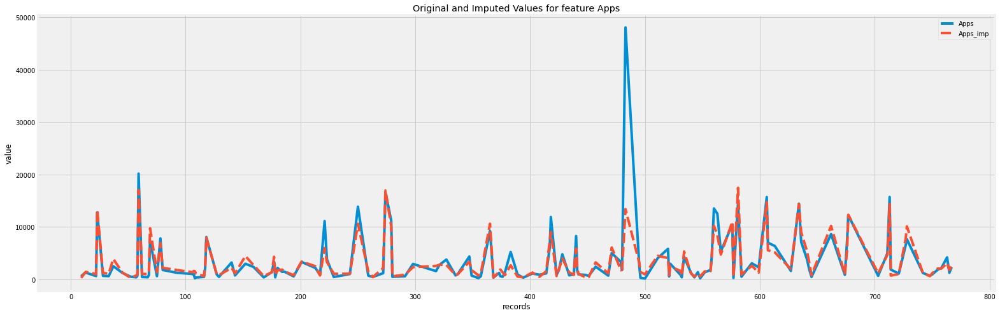

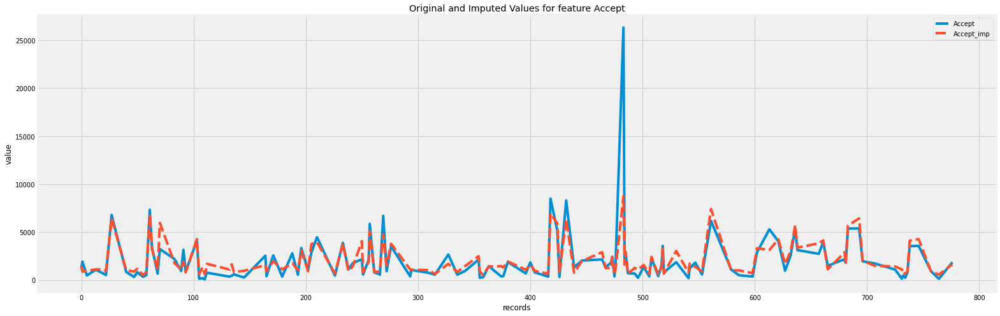

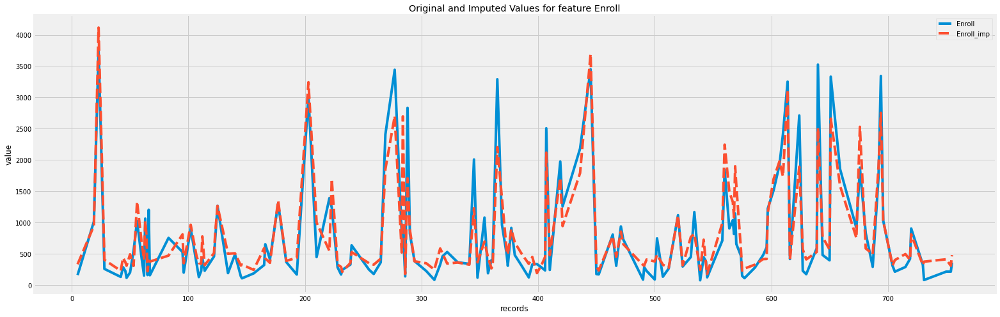

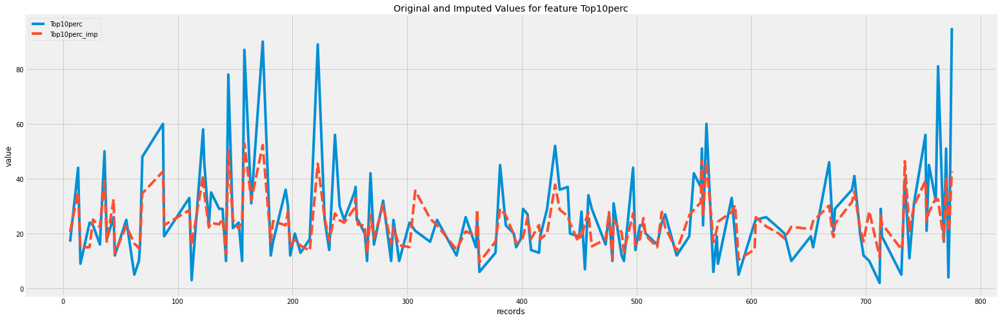

...

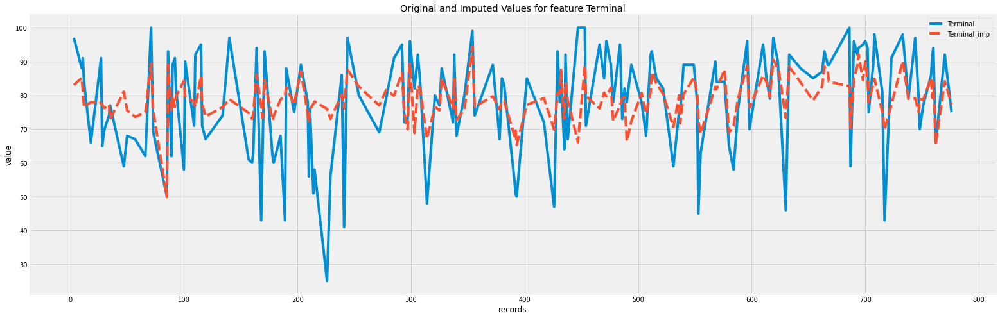

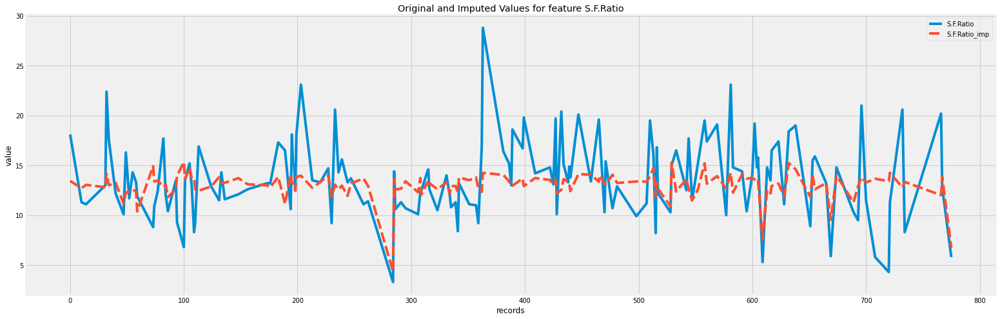

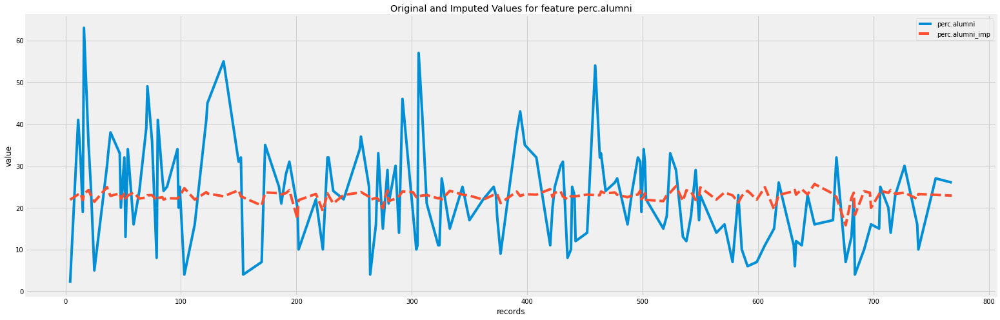

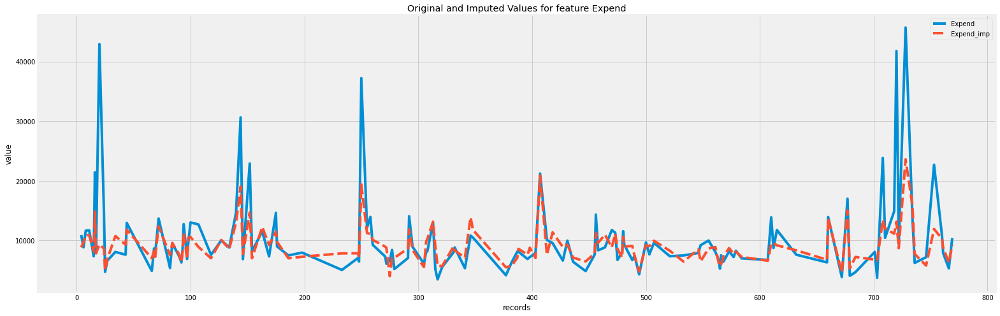

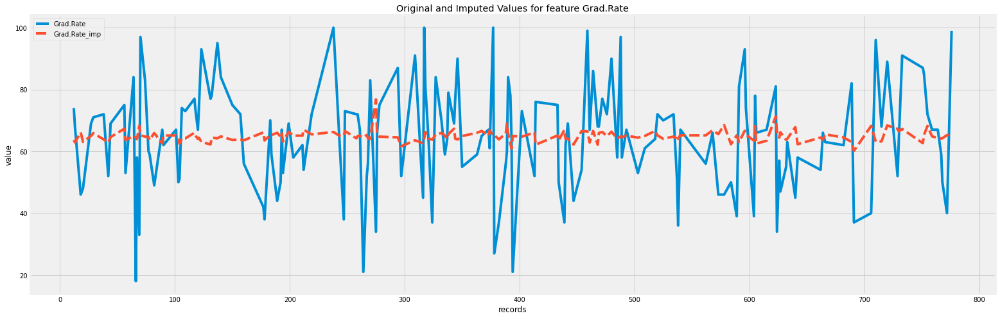

In [5]:
#line graph of 100 first values of each col
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotlinegraph(temp_df,x)

In [0]:
###function to get bar plot
##percentage of imputed values within some error window

def getFeatureDataBarPlot(df):
  within_err = []
  error_allowed = 5
  all_err = []
  for col in all_col_names:
    temp_df = getdf(df,col)
    col_imp = col + '_imp'
    error_allowed = temp_df[col].std()/2 #/np.sqrt(len(temp_df[col]))
    all_err.append(error_allowed)

    x = temp_df[col] - temp_df[col_imp] 
    lst = x.to_list()
    count = len([i for i in lst if abs(i) < error_allowed]) 
    ans = count*100/len(temp_df[col])
    within_err.append(round(ans,2))

  print(within_err)

  ###bar plot code
  y_pos = np.arange(len(all_col_names))
  
  ax = plt.figure(figsize=(12, 8))
  plt.barh(y_pos, within_err, align='center', alpha=0.5)
  for index, value in enumerate(within_err):
    plt.text(value, index, str(value) + '%'+ '(+/-' + str(round(abs(all_err[index]),2)) +')' , verticalalignment='center')
  plt.yticks(y_pos, all_col_names)
  plt.xlabel('percentage')
  plt.ylabel('features')
  plt.title('Values within error threshold')
  plt.show()

[80.74, 94.7, 94.74, 87.97, 68.42, 51.57, 88.89, 86.96, 46.15, 35.03, 40.58, 50.96, 57.06, 52.38, 47.74, 36.13, 90.0, 41.52]


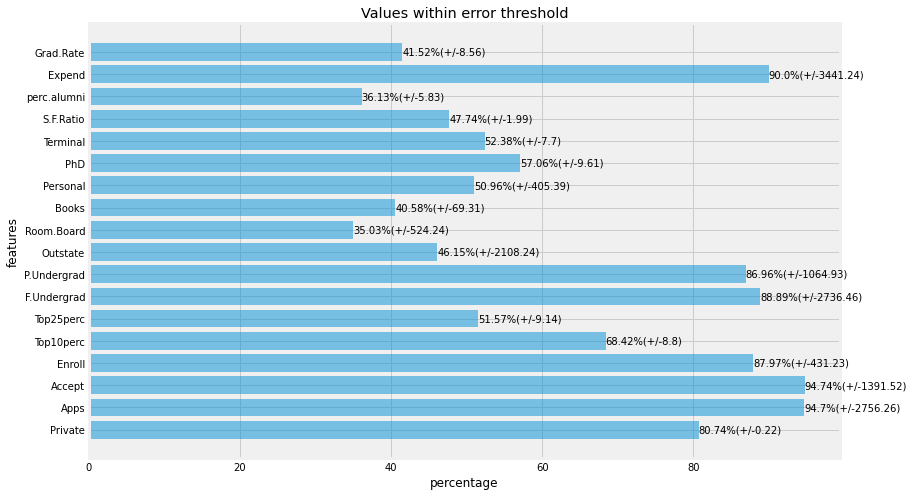

In [7]:
getFeatureDataBarPlot(combined_df)

In [0]:
def getslope(df, col):
  regr = linear_model.LinearRegression()
  X = df.index.values.reshape(-1,1)
  y = df[col].values.reshape(-1,1)
  regr.fit(X, y)
  return regr.coef_[0], regr.intercept_

In [0]:
###function to plot scatter plus linear of original + imputed
def plotscatterLR(df,cl):
  cl_imp = cl + '_imp'
  ax = plt.figure(figsize=(24, 8))
  p1 = sns.regplot(x=df.index,y=[df[cl]],data=df, fit_reg=True, label='original',ci=68) 
  p2 = sns.regplot(x=df.index,y=[df[cl_imp]],data=df, fit_reg=True, label='imputed',ci=68) 

  slope1, intercept1 = getslope(df, cl)
  slope2, intercept2 = getslope(df, cl_imp)

  plt.grid(color='grey', linestyle='-', linewidth=0.3)
  plt.xlabel('records')
  plt.ylabel('value')
 
  props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
  textstr = 'slope = '+ str(slope1) +', intercept = '+str(intercept1)+'\n' + 'slope = '+ str(slope2) +', intercept = '+str(intercept2)
# place a text box in upper left in axes coords
  ax.text(0.08, 0.97, textstr, fontsize=15,verticalalignment='top', bbox=props,transform=p1.transAxes)

  plt.legend(loc='upper left')
  plt.title(cl)
  plt.show()

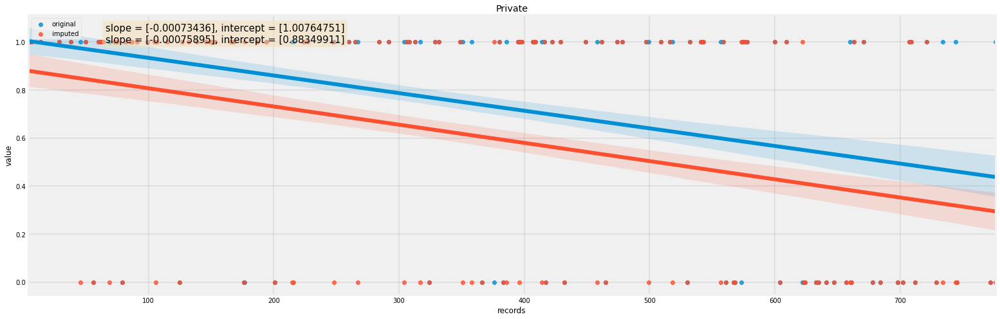

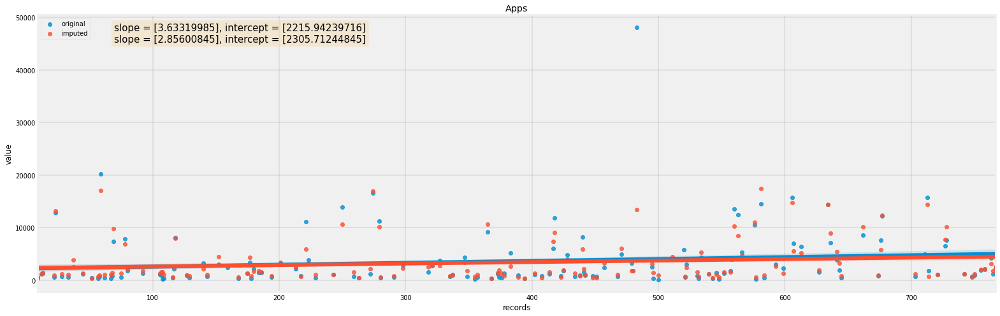

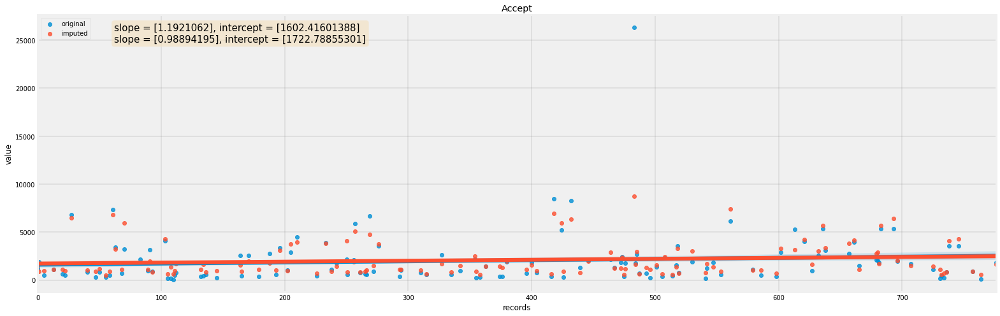

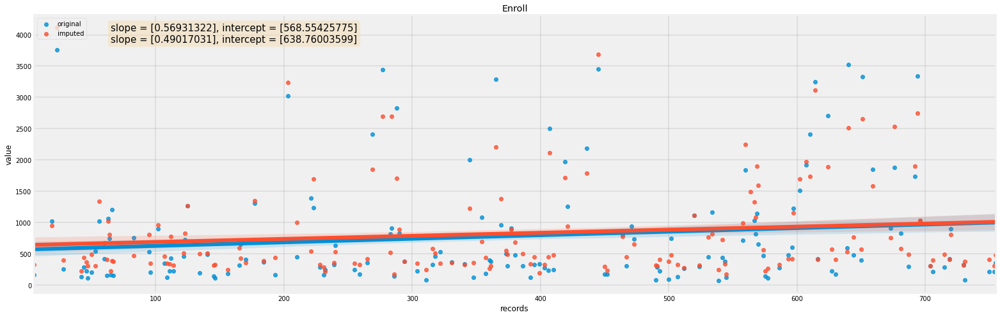

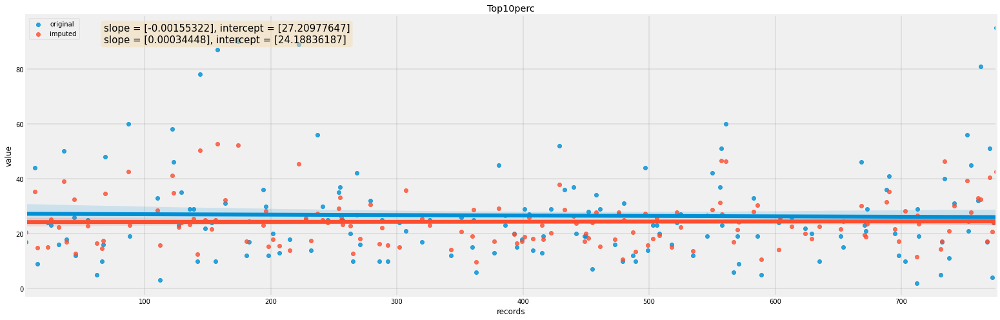

...

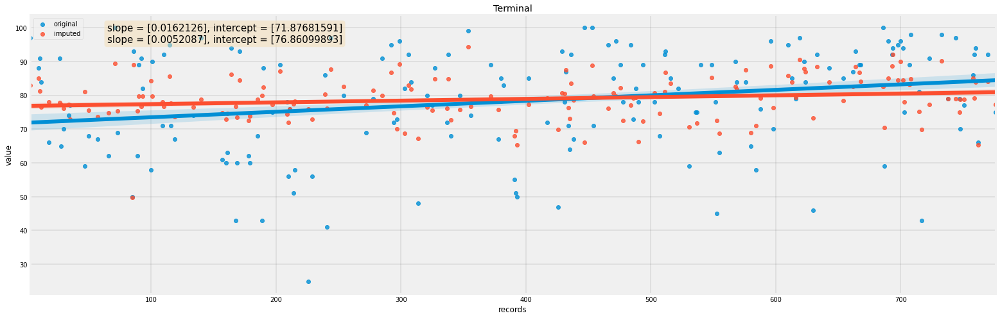

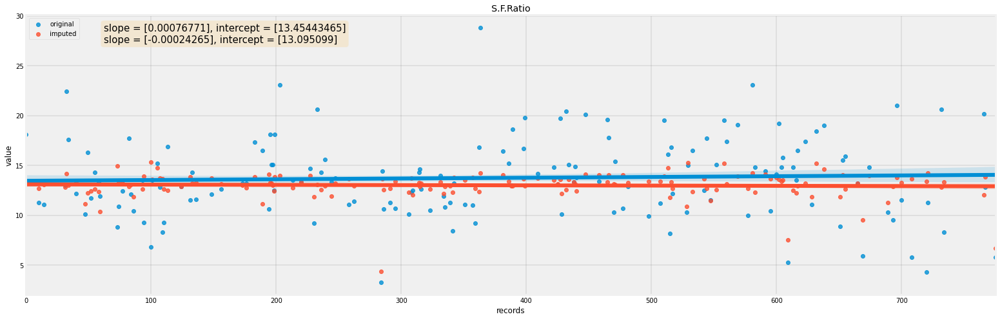

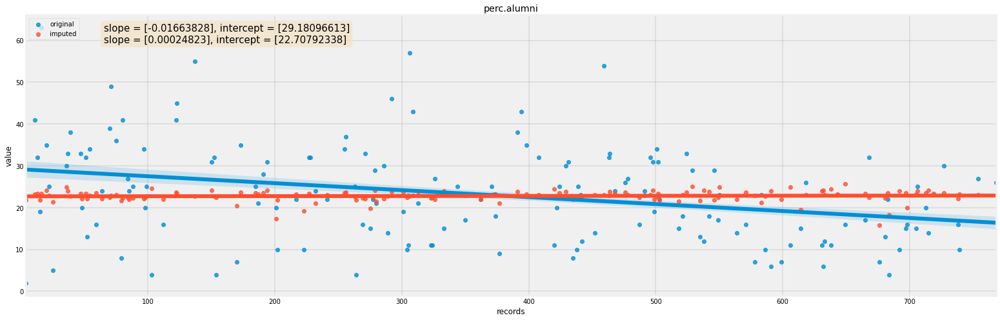

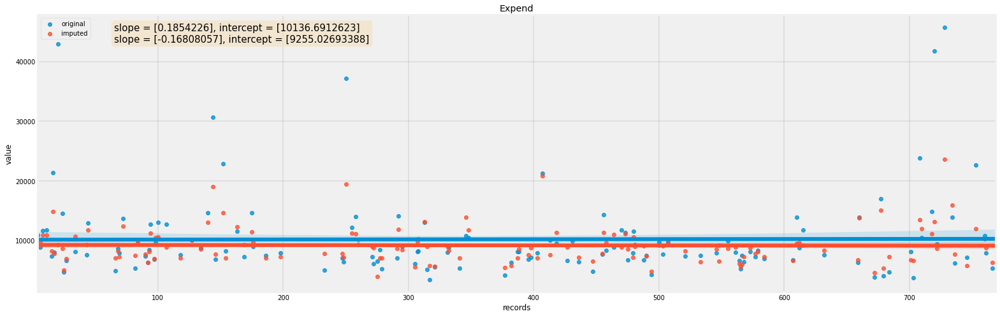

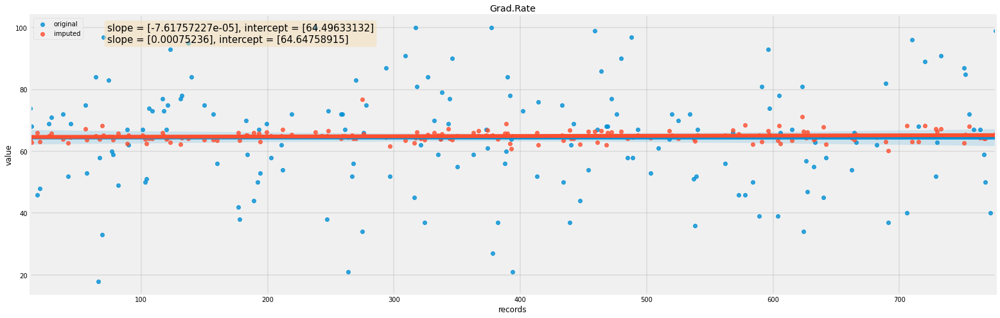

In [10]:
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotscatterLR(temp_df,x)

In [0]:
####everything for spam dataset
dataset = 'spam'
filename = dataset + '/' + dataset +'.csv'

original_df = pd.read_csv(filename)
all_col_names = original_df.columns.to_list()

mis_col_names = [i+'_mis' for i in all_col_names]
imp_col_names = [i+'_imp' for i in all_col_names]

miss_filename = dataset +'/missing.csv'
imp_filename = dataset +'/imputed.csv'
miss_df = pd.read_csv(miss_filename,names= mis_col_names)
imp_df = pd.read_csv(imp_filename,names= imp_col_names)

df4 = original_df.join(miss_df)
combined_df = df4.join(imp_df)

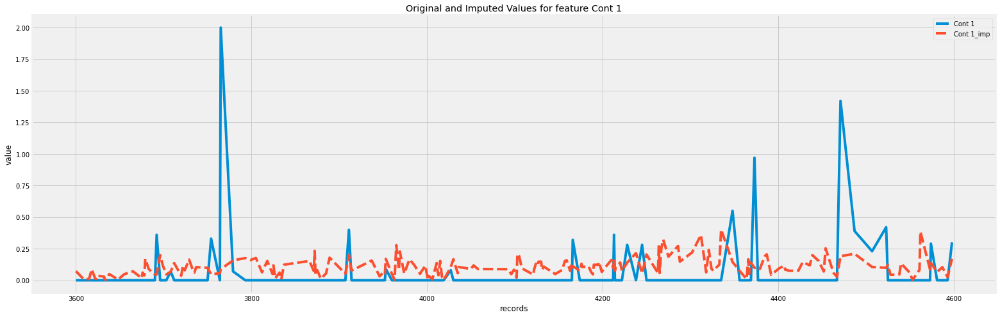

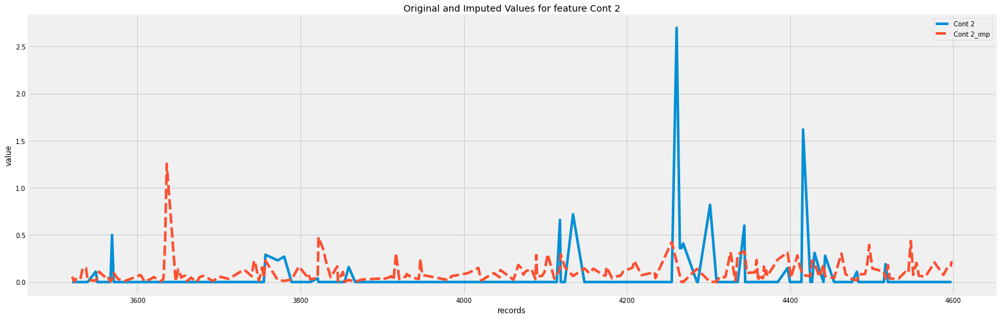

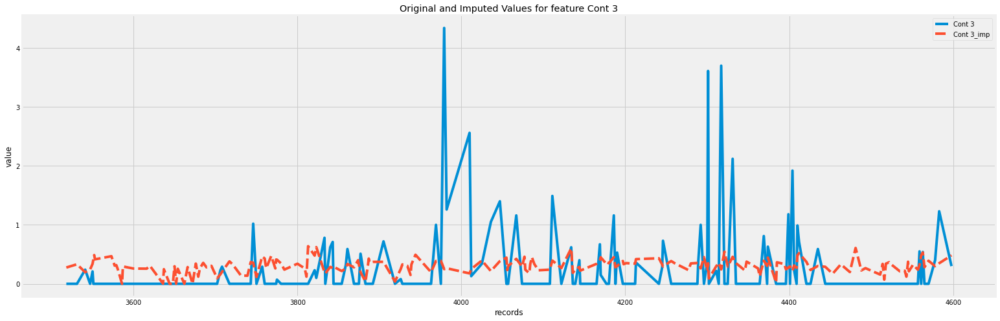

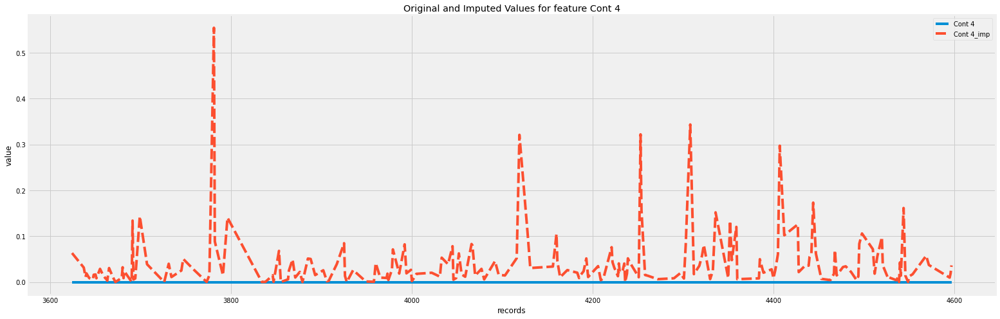

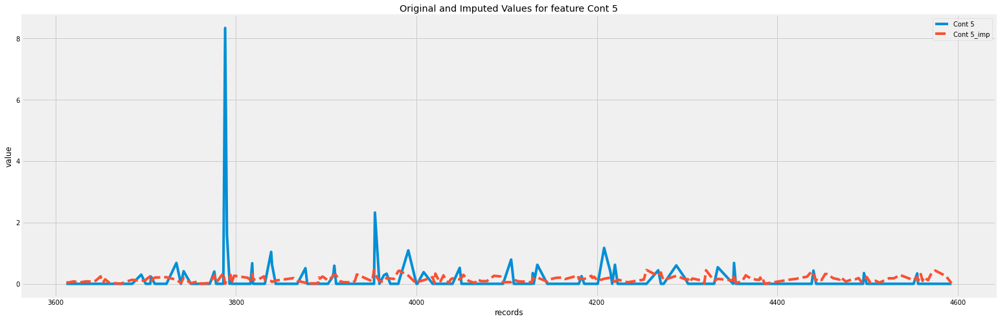

...

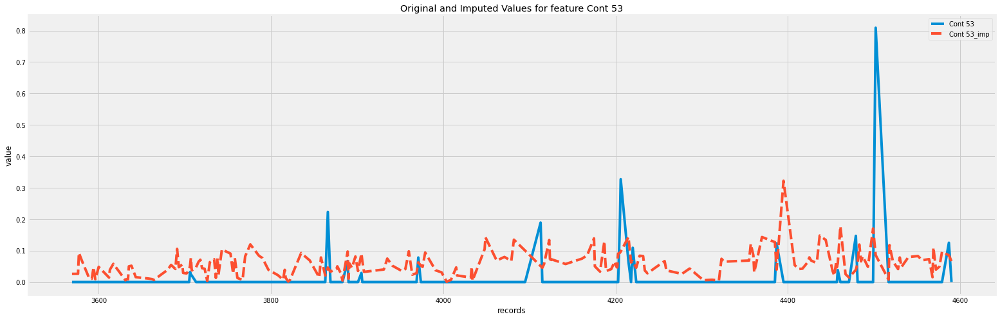

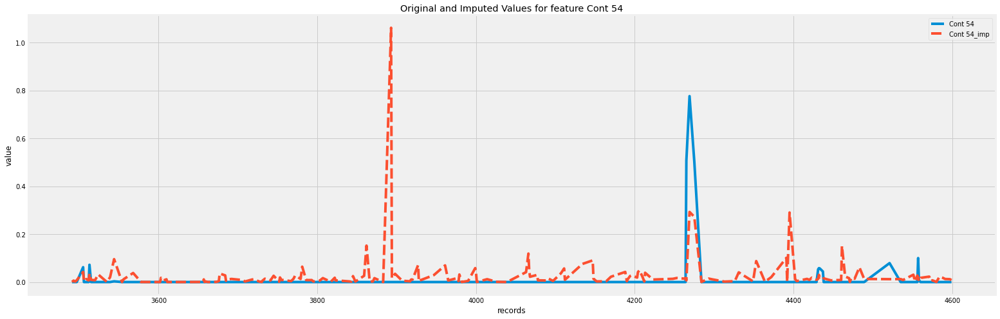

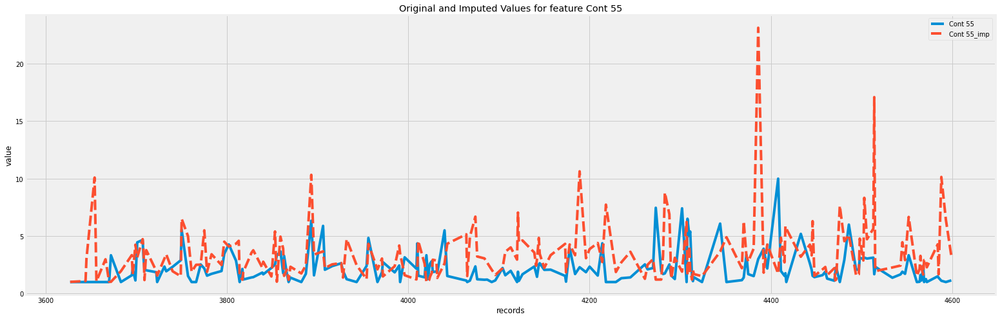

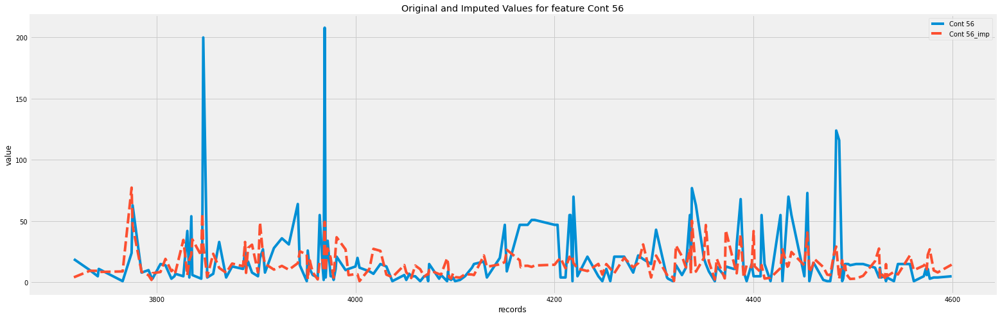

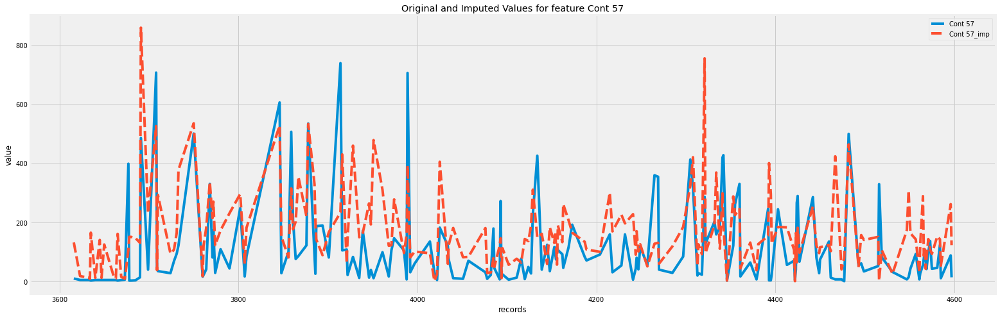

In [12]:
#line graph of 100 first values of each col
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotlinegraph(temp_df,x)

[65.7, 94.89, 42.94, 99.78, 75.54, 77.6, 85.57, 83.79, 86.14, 64.87, 86.1, 42.87, 82.77, 94.57, 94.41, 87.56, 83.66, 81.25, 41.2, 92.18, 59.17, 96.86, 86.89, 86.15, 88.04, 85.94, 93.9, 91.18, 95.74, 90.33, 93.93, 97.29, 93.01, 97.77, 94.61, 84.32, 80.27, 95.03, 89.41, 92.89, 95.72, 88.9, 91.77, 86.33, 78.4, 90.54, 98.72, 92.1, 94.67, 70.73, 87.61, 89.98, 84.94, 95.96, 96.58, 88.46, 76.6]


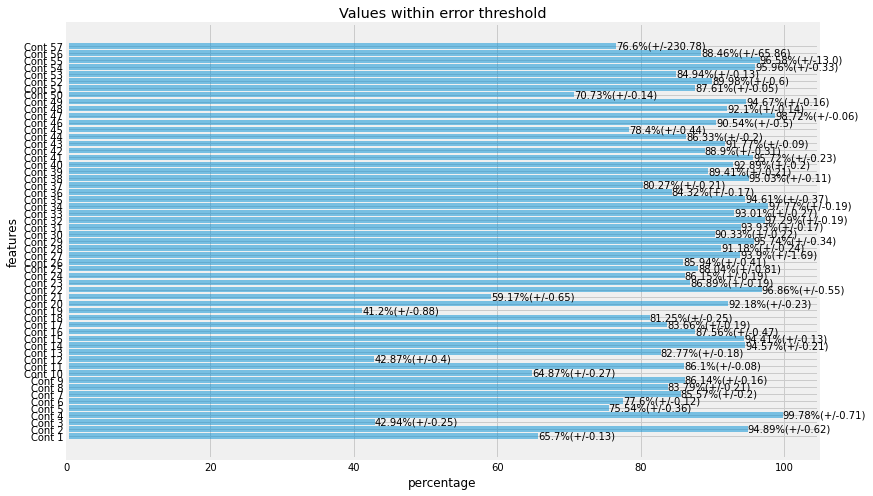

In [13]:
getFeatureDataBarPlot(combined_df)

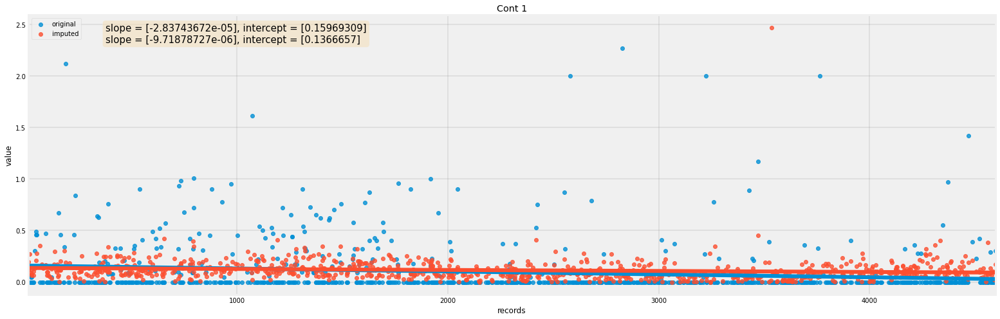

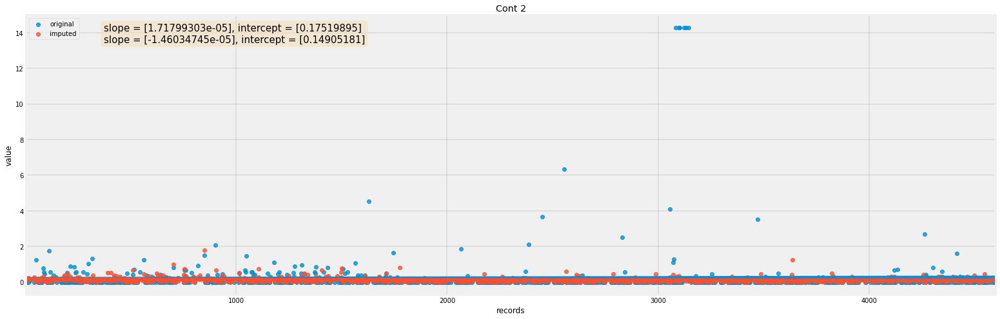

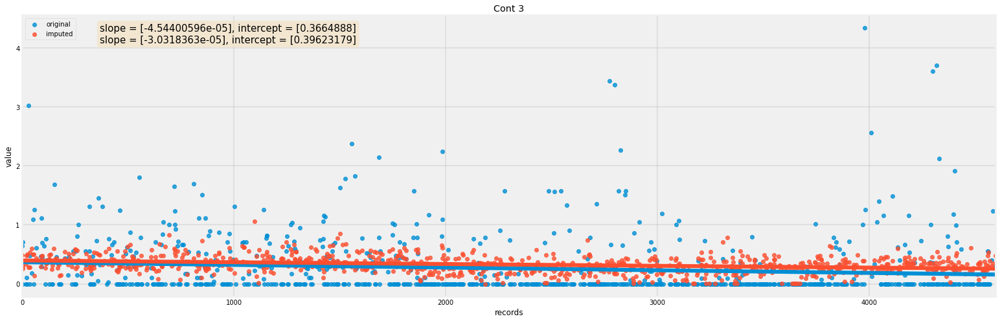

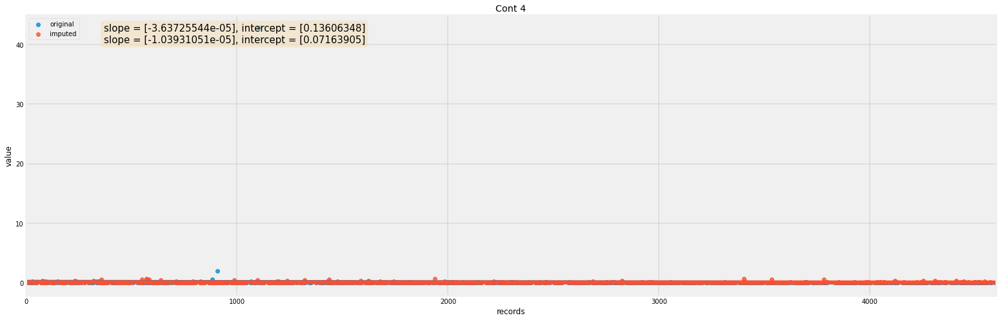

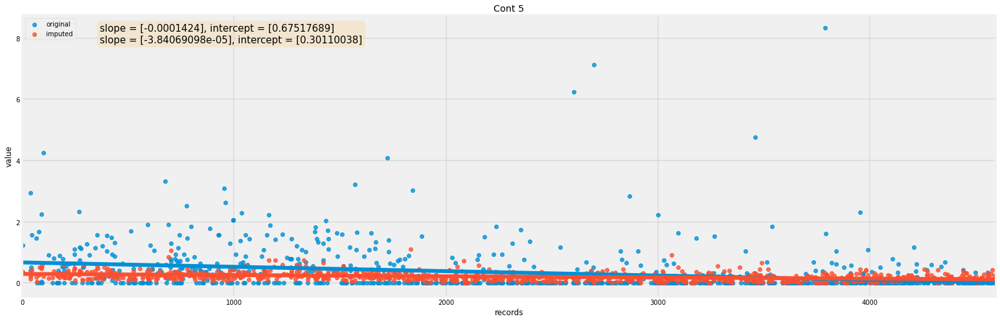

...

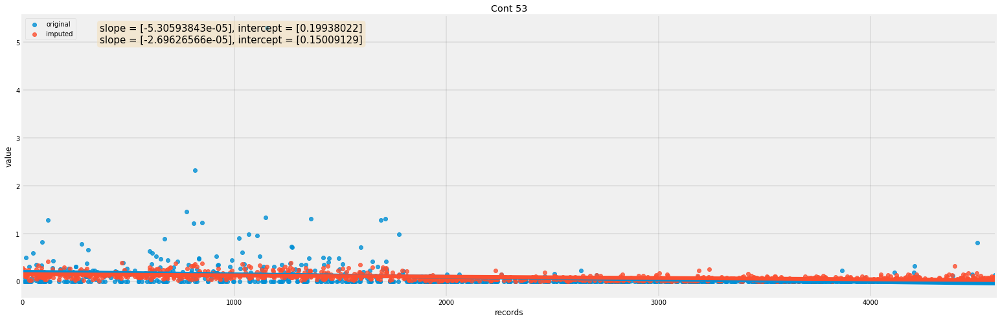

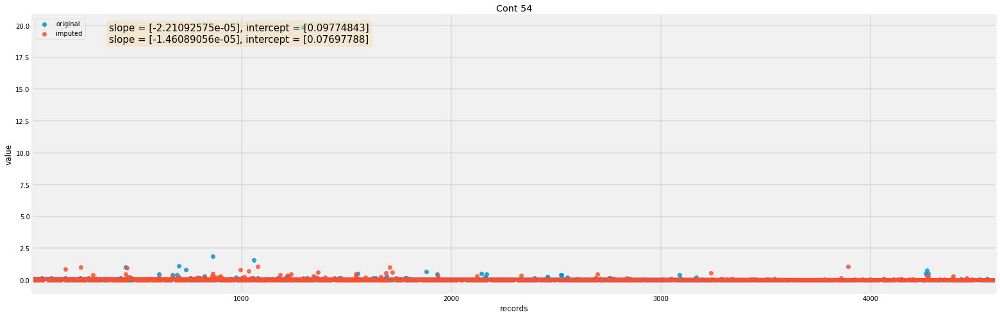

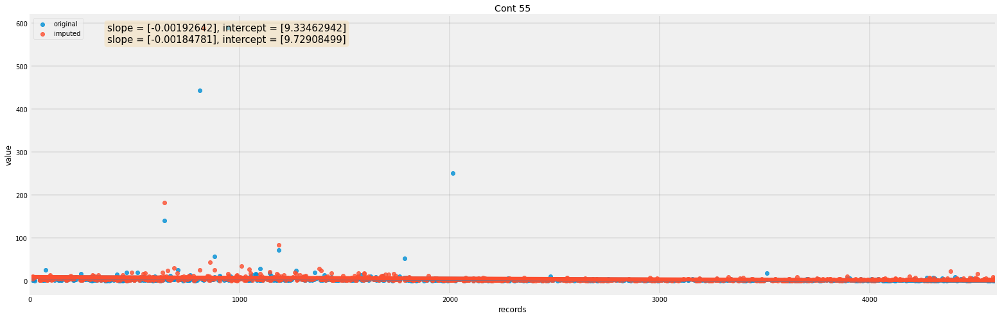

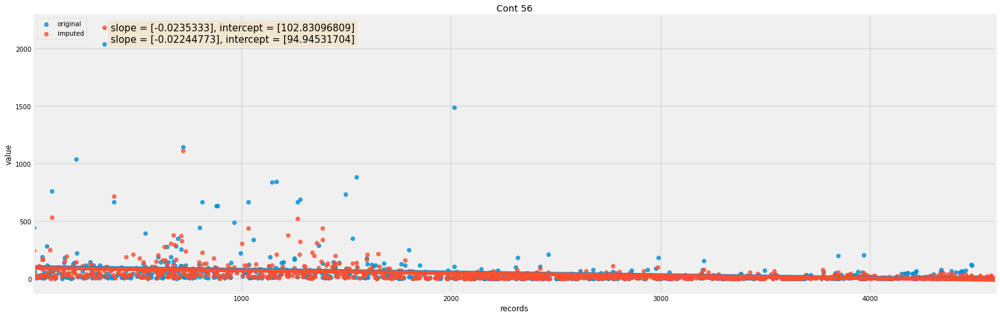

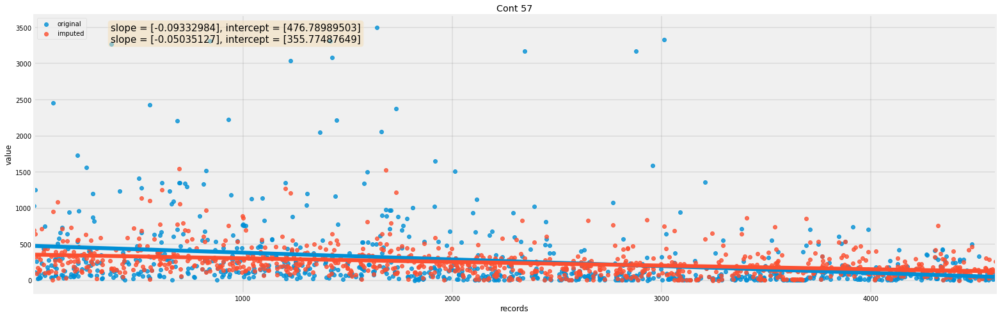

In [14]:
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotscatterLR(temp_df,x)

In [0]:
####everything for letter dataset
dataset = 'letter'
filename = dataset + '/' + dataset +'.csv'

original_df = pd.read_csv(filename)
all_col_names = original_df.columns.to_list()

mis_col_names = [i+'_mis' for i in all_col_names]
imp_col_names = [i+'_imp' for i in all_col_names]

miss_filename = dataset +'/missing.csv'
imp_filename = dataset +'/imputed.csv'
miss_df = pd.read_csv(miss_filename,names= mis_col_names)
imp_df = pd.read_csv(imp_filename,names= imp_col_names)

df4 = original_df.join(miss_df)
combined_df = df4.join(imp_df)


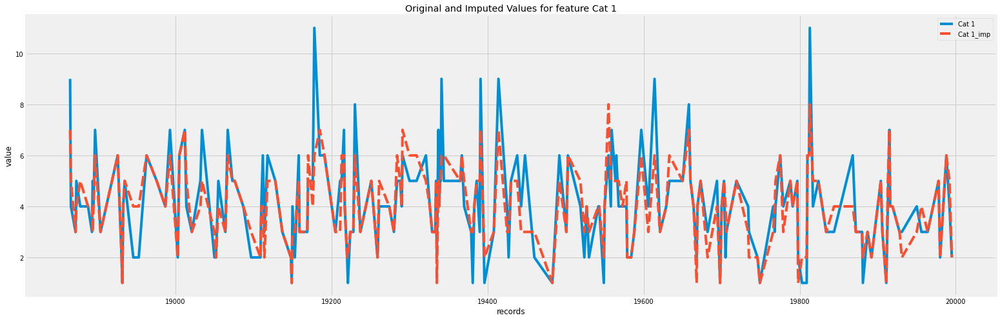

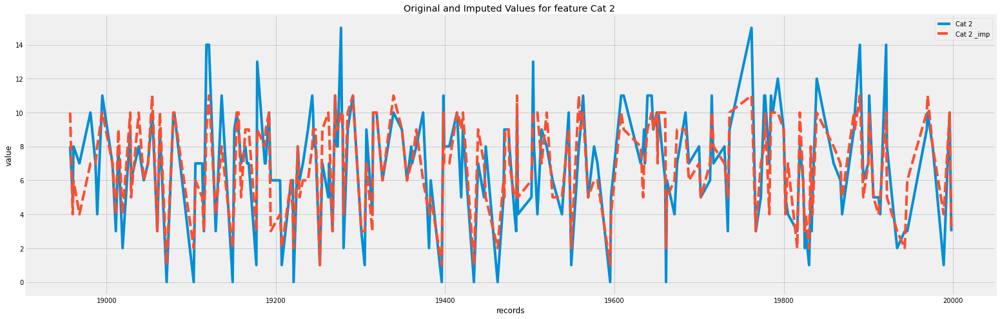

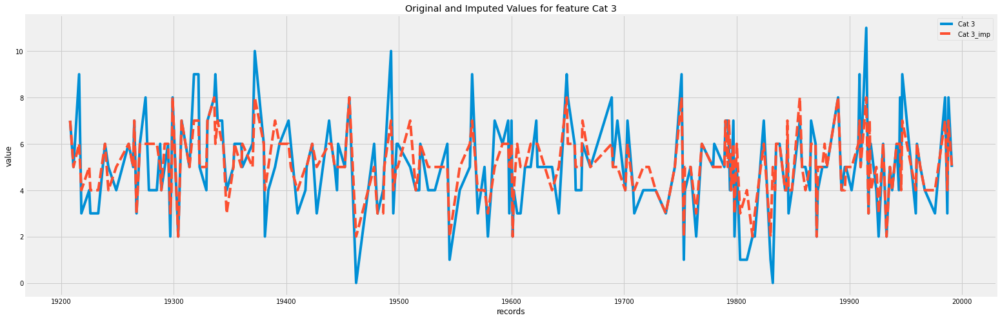

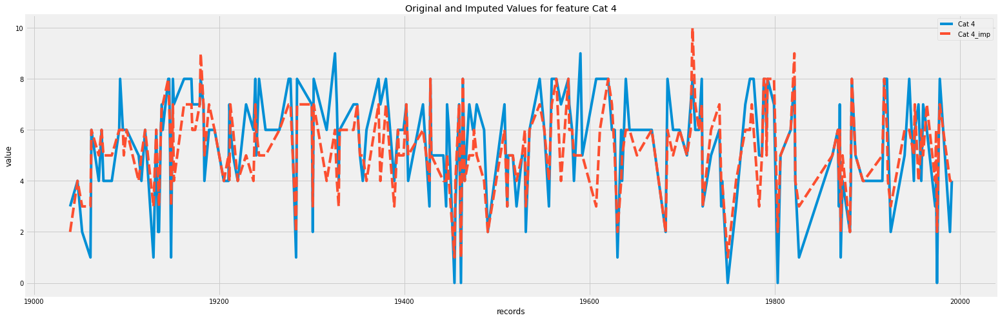

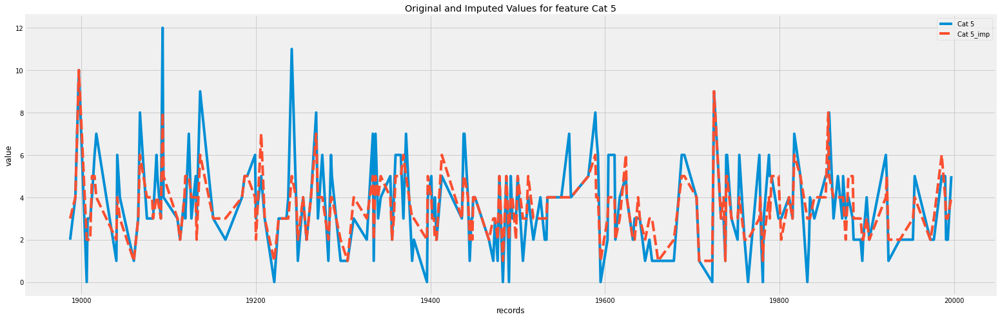

...

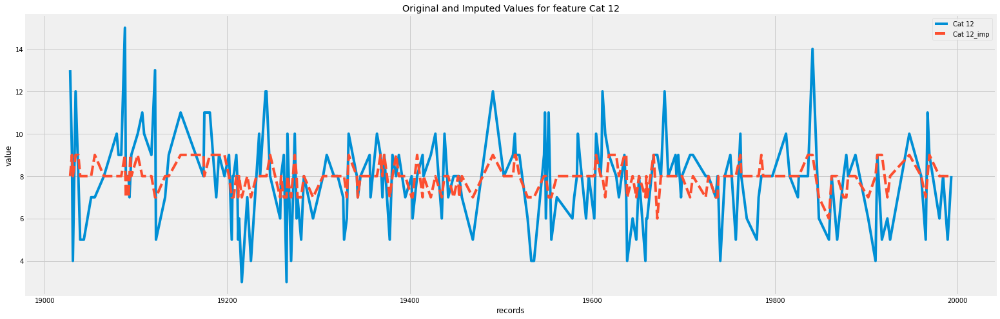

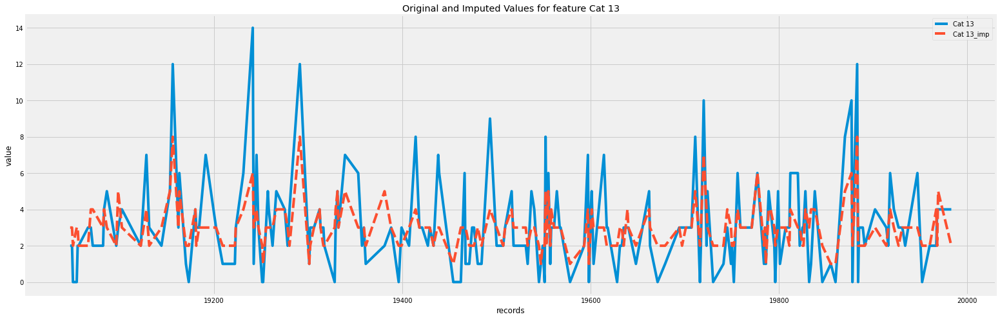

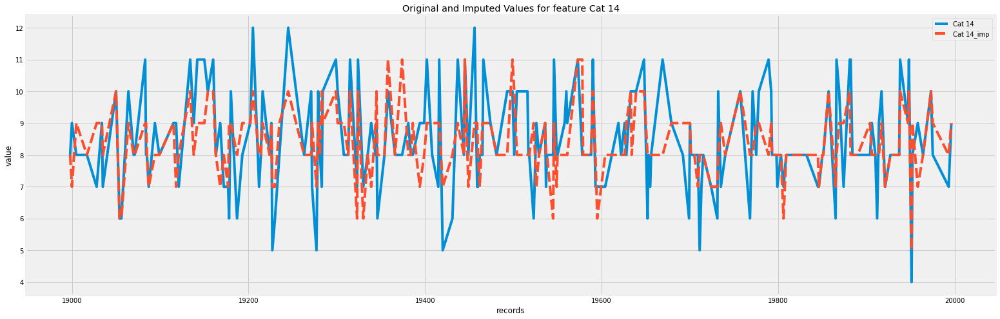

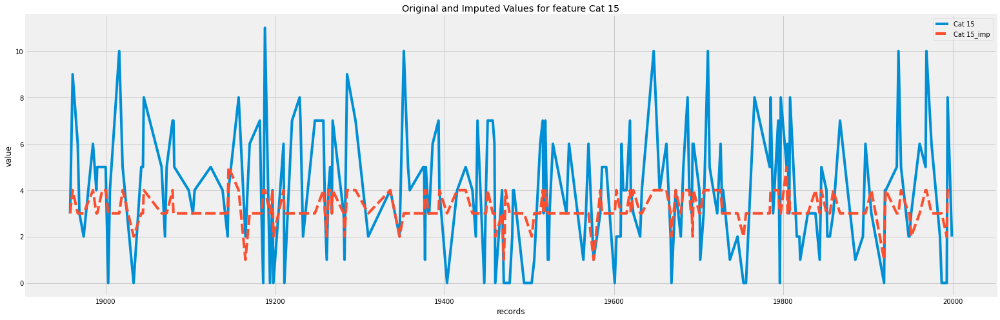

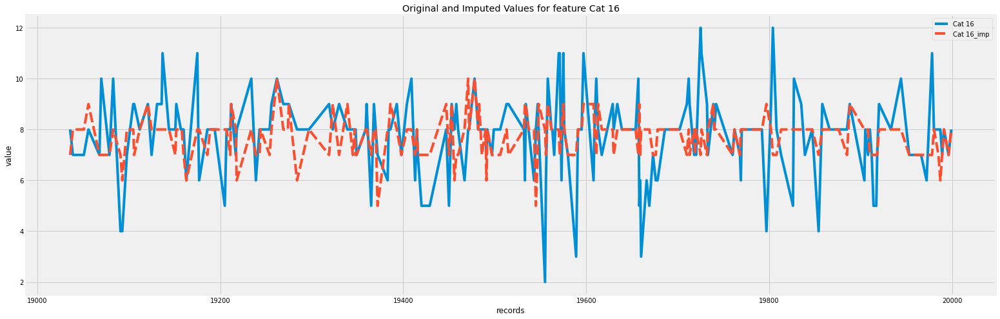

In [16]:
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotlinegraph(temp_df,x)

[43.8, 62.22, 39.64, 79.08, 80.75, 70.52, 69.36, 46.34, 48.22, 45.54, 64.04, 63.9, 67.46, 39.13, 48.45, 33.59]


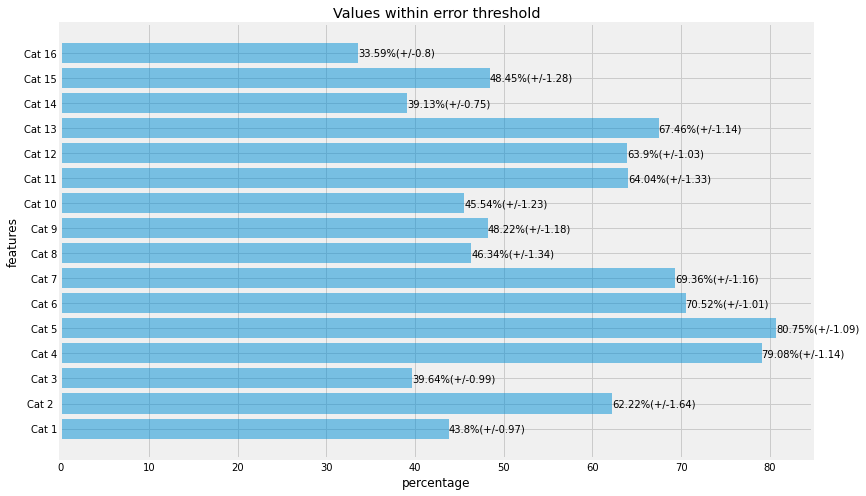

In [17]:
getFeatureDataBarPlot(combined_df)

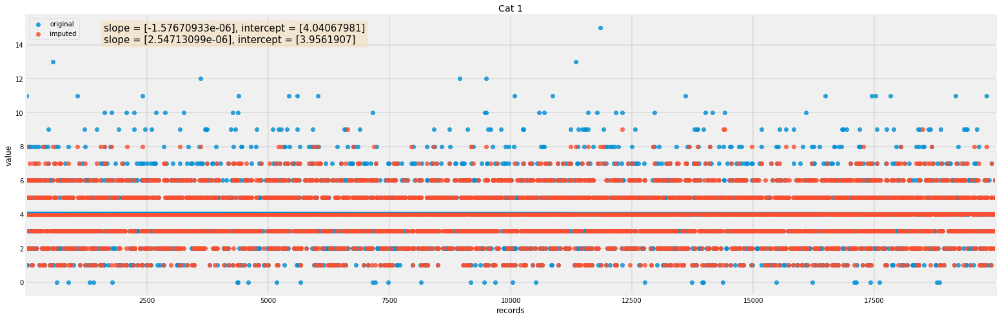

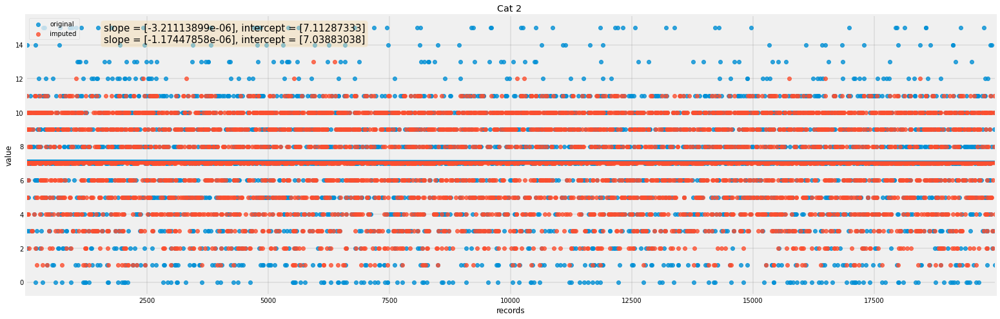

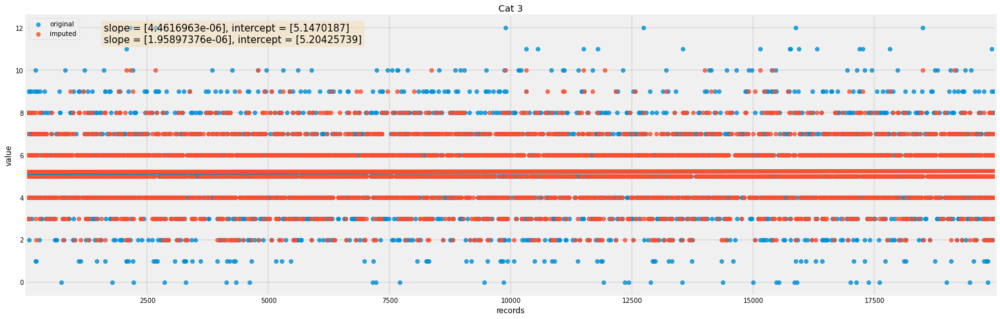

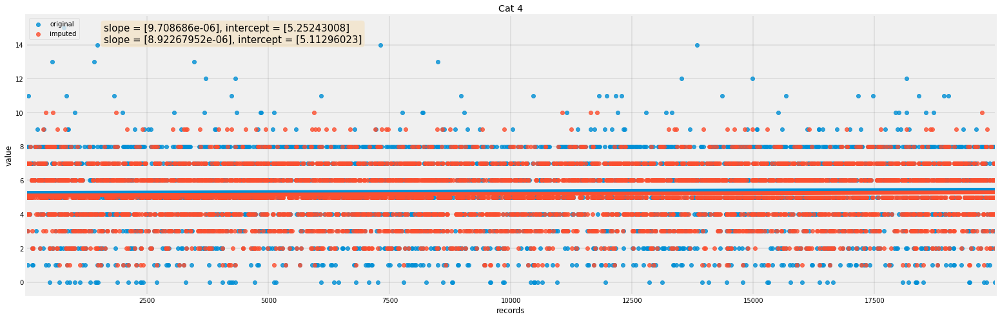

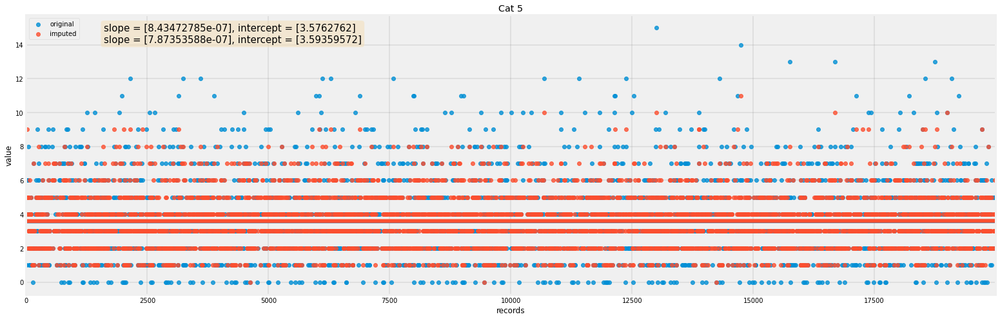

...

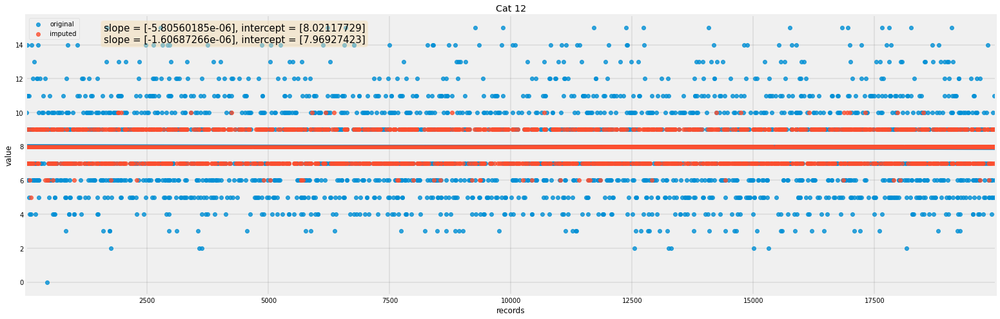

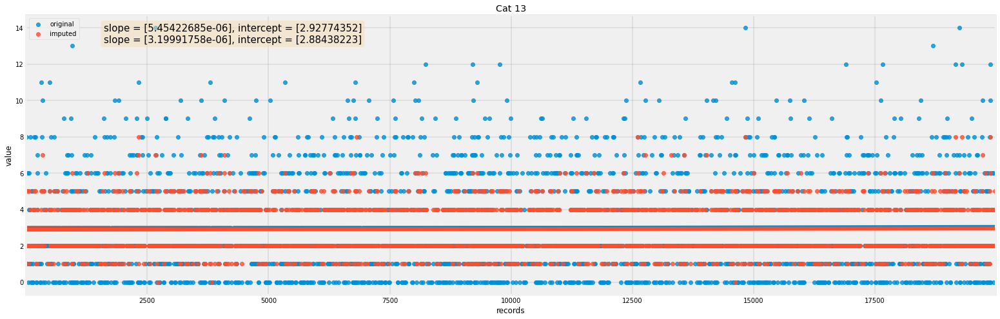

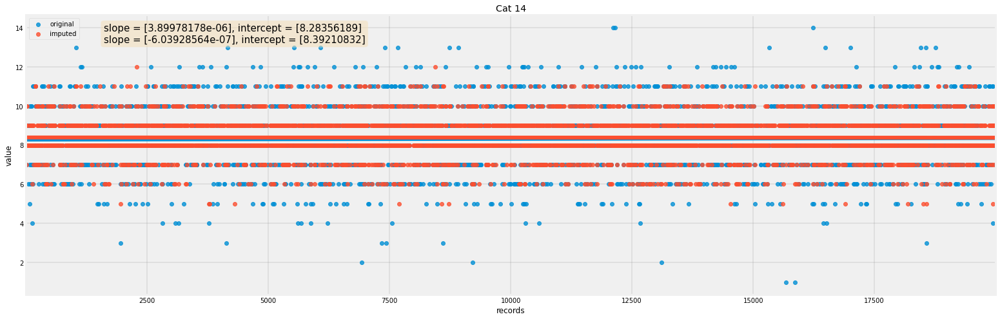

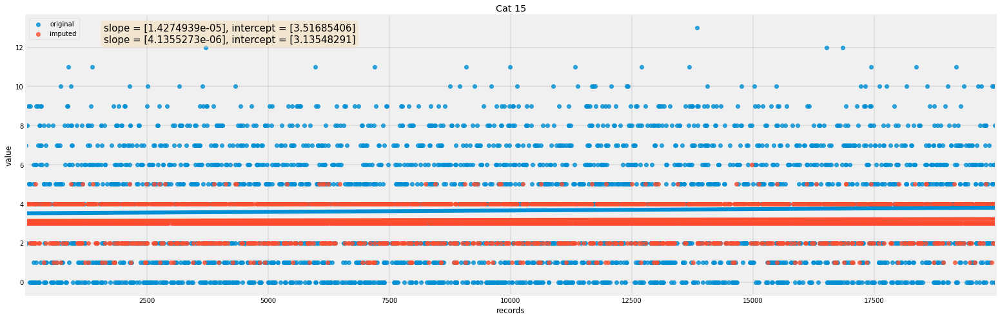

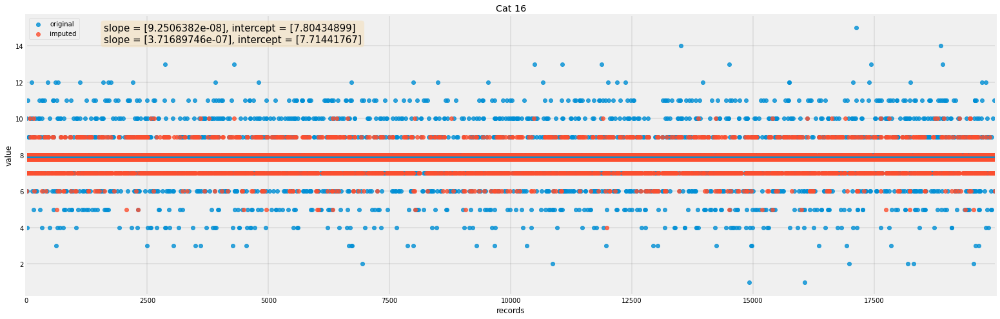

In [18]:
for x in all_col_names:
  temp_df = getdf(combined_df,x)
  plotscatterLR(temp_df,x)